<a href="https://colab.research.google.com/github/menna03/Food101/blob/main/Working_TF_EffecientNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import Libraries

In [ ]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow as tfs
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3, EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, EarlyStopping, TensorBoard
from tensorflow.keras import regularizers, mixed_precision
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Download and Explore:

## Deployment:

In [ ]:
import os
# Helper function to download data and extract
def get_data_extract():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    print("Downloading the data...")
    !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
    print("Dataset downloaded!")
    print("Extracting data..")
    !tar xzvf food-101.tar.gz
    print("Extraction done!")

# Check the extracted dataset folder
get_data_extract()

if "food-101" in os.listdir():
    print("Dataset directory exists. Contents:")
    !ls food-101/
else:
    print("Dataset directory does not exist.")

Streaming output truncated to the last 5000 lines.
food-101/images/cannoli/3778102.jpg
food-101/images/cannoli/2674065.jpg
food-101/images/cannoli/1169899.jpg
food-101/images/cannoli/1378086.jpg
food-101/images/cannoli/803909.jpg
food-101/images/cannoli/1067240.jpg
food-101/images/cannoli/3002709.jpg
food-101/images/cannoli/2612632.jpg
food-101/images/cannoli/3627612.jpg
food-101/images/cannoli/1798703.jpg
food-101/images/cannoli/560632.jpg
food-101/images/cannoli/512468.jpg
food-101/images/cannoli/2331523.jpg
food-101/images/cannoli/3118302.jpg
food-101/images/cannoli/1499412.jpg
food-101/images/cannoli/1557459.jpg
food-101/images/cannoli/146566.jpg
food-101/images/cannoli/96922.jpg
food-101/images/cannoli/1699562.jpg
food-101/images/cannoli/730051.jpg
food-101/images/cannoli/2177977.jpg
food-101/images/cannoli/2767028.jpg
food-101/images/cannoli/6564.jpg
food-101/images/cannoli/553447.jpg
food-101/images/cannoli/3452001.jpg
food-101/images/cannoli/1201456.jpg
food-101/images/cannoli/

## Understanding the Enemy:

In [ ]:
os.listdir('food-101/meta')

['test.txt',
 'train.txt',
 'classes.txt',
 'labels.txt',
 'test.json',
 'train.json']

In [ ]:
!head food-101/meta/train.txt

apple_pie/1005649
apple_pie/1014775
apple_pie/1026328
apple_pie/1028787
apple_pie/1043283
apple_pie/1050519
apple_pie/1057749
apple_pie/1057810
apple_pie/1072416
apple_pie/1074856


In [ ]:
!head food-101/meta/classes.txt

apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito


In [ ]:
os.listdir('food-101/images')

['baklava',
 'french_onion_soup',
 'onion_rings',
 'hot_dog',
 'cup_cakes',
 'grilled_salmon',
 'pork_chop',
 'edamame',
 'pizza',
 'apple_pie',
 'donuts',
 'fried_calamari',
 'tacos',
 'ice_cream',
 'creme_brulee',
 'grilled_cheese_sandwich',
 'huevos_rancheros',
 'lasagna',
 'club_sandwich',
 'eggs_benedict',
 'bruschetta',
 'french_fries',
 'filet_mignon',
 'chocolate_cake',
 'gnocchi',
 'chocolate_mousse',
 'strawberry_shortcake',
 'cheese_plate',
 'ramen',
 'spaghetti_bolognese',
 'bibimbap',
 'beet_salad',
 'gyoza',
 'frozen_yogurt',
 'pad_thai',
 'lobster_roll_sandwich',
 'dumplings',
 'omelette',
 'beef_tartare',
 'chicken_quesadilla',
 'deviled_eggs',
 'french_toast',
 'churros',
 'tuna_tartare',
 'peking_duck',
 'spring_rolls',
 'prime_rib',
 'bread_pudding',
 'seaweed_salad',
 'samosa',
 'hummus',
 'paella',
 'chicken_wings',
 'poutine',
 'spaghetti_carbonara',
 'clam_chowder',
 'garlic_bread',
 'ravioli',
 'takoyaki',
 'lobster_bisque',
 'baby_back_ribs',
 'fried_rice',
 'g

## Visualization is Key

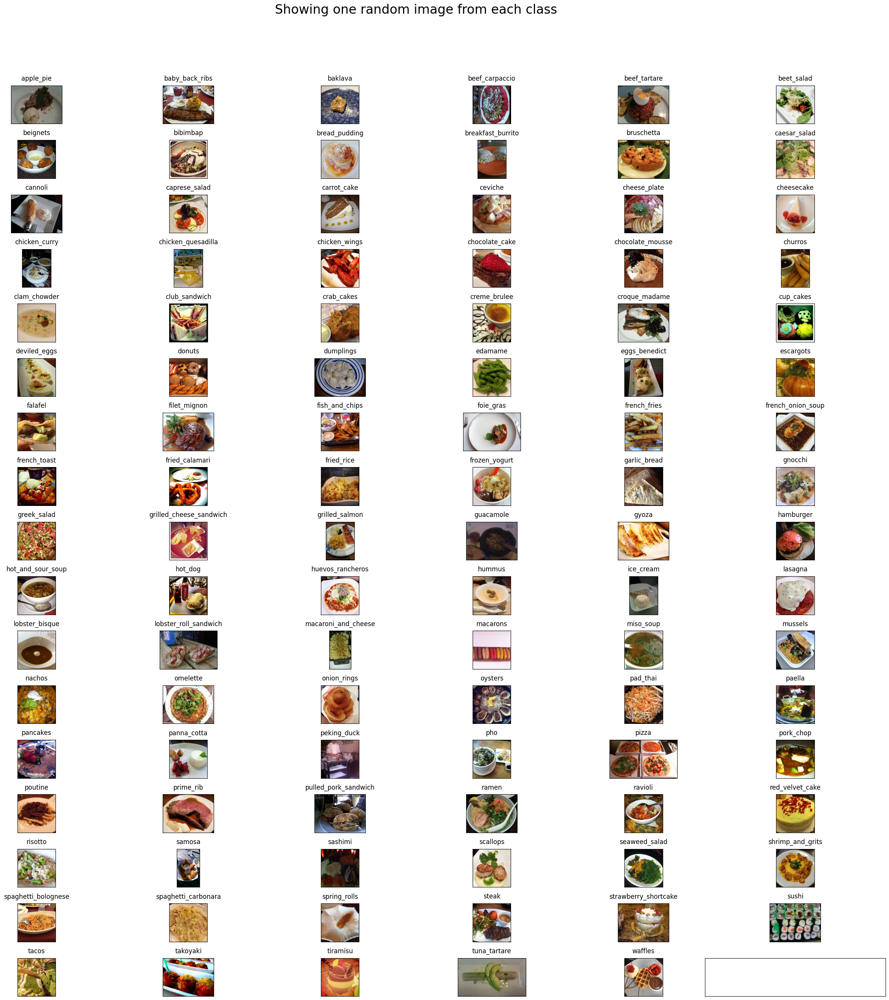

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
# Visualize the data, showing one image per class from 101 classes
rows = 17
cols = 6
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "food-101/images/"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id]
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)

plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()
# https://matplotlib.org/users/tight_layout_guide.html

In [ ]:
# Helper method to split dataset into train and test folders
def prepare_data(filepath, src,dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [ ]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
%cd /content
print("Creating train data...")
prepare_data('/content/food-101/meta/train.txt', '/content/food-101/images', 'train')

/content
Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

C

In [ ]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('/content/food-101/meta/test.txt', '/content/food-101/images', 'test')

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

#2. Preprocessing: Transforming the Raw Material


In [ ]:
# Check how many files are in the train folder
print("Total number of samples in train folder")
!find train -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
75750


In [ ]:
# Check how many files are in the test folder
print("Total number of samples in test folder")
!find test -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
25250


In [ ]:
# Get all class names (folder names) to create a label mapping
## The function essentially returns a sorted list of all class names
def get_class_names(folder_path):
    return sorted([dir_name for dir_name in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, dir_name))])

# Create a dictionary that maps class names to integers
#This function provides a way to convert class names into numerical labels
def create_label_map(class_names):
    return {class_name: index for index, class_name in enumerate(class_names)}


In [ ]:
# Create a lookup table for labels
#The lookup table enables efficient conversion of class names  into integer labels,
def create_lookup_table(label_map):
    keys = tf.constant(list(label_map.keys()))
    values = tf.constant(list(label_map.values()))
    return tf.lookup.StaticHashTable(
        tf.lookup.KeyValueTensorInitializer(keys, values, key_dtype=tf.string, value_dtype=tf.int32),
        default_value=-1
    )


In [ ]:
# Function to preprocess images
#The preprocessing steps include reading the image from a file, decoding it, resizing it,
def preprocess_img(img_path, img_size=(224, 224)):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, img_size)
    img = img / 255.0
    return img

# 3. Data Pipeline with tf.data API: Building the Training Autobahn

In [ ]:

# unction is designed to load images and their corresponding labels from a directory, preprocess them, and organize them into batches for training or inference in a deep learning model.
# Function to load dataset and handle labels
def load_dataset(folder_path, batch_size=32, img_size=(224, 224), label_map=None):
    lookup_table = create_lookup_table(label_map)

    def process_path(img_path):
        img = preprocess_img(img_path, img_size)
        class_name = tf.strings.split(img_path, os.path.sep)[-2]
        label_index = lookup_table.lookup(class_name)
        label = tf.one_hot(label_index, depth=len(label_map))
        return img, label

    dataset = tf.data.Dataset.list_files(f"{folder_path}/*/*.jpg", shuffle=False)
    dataset = dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

# Define the folder path and class names
folder_path = 'train'
class_names = get_class_names(folder_path)
label_map = create_label_map(class_names)

# Load the training and test datasets
train_dataset = load_dataset('train', batch_size=32, label_map=label_map)
test_dataset = load_dataset('test', batch_size=32, label_map=label_map)

In [ ]:
train_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

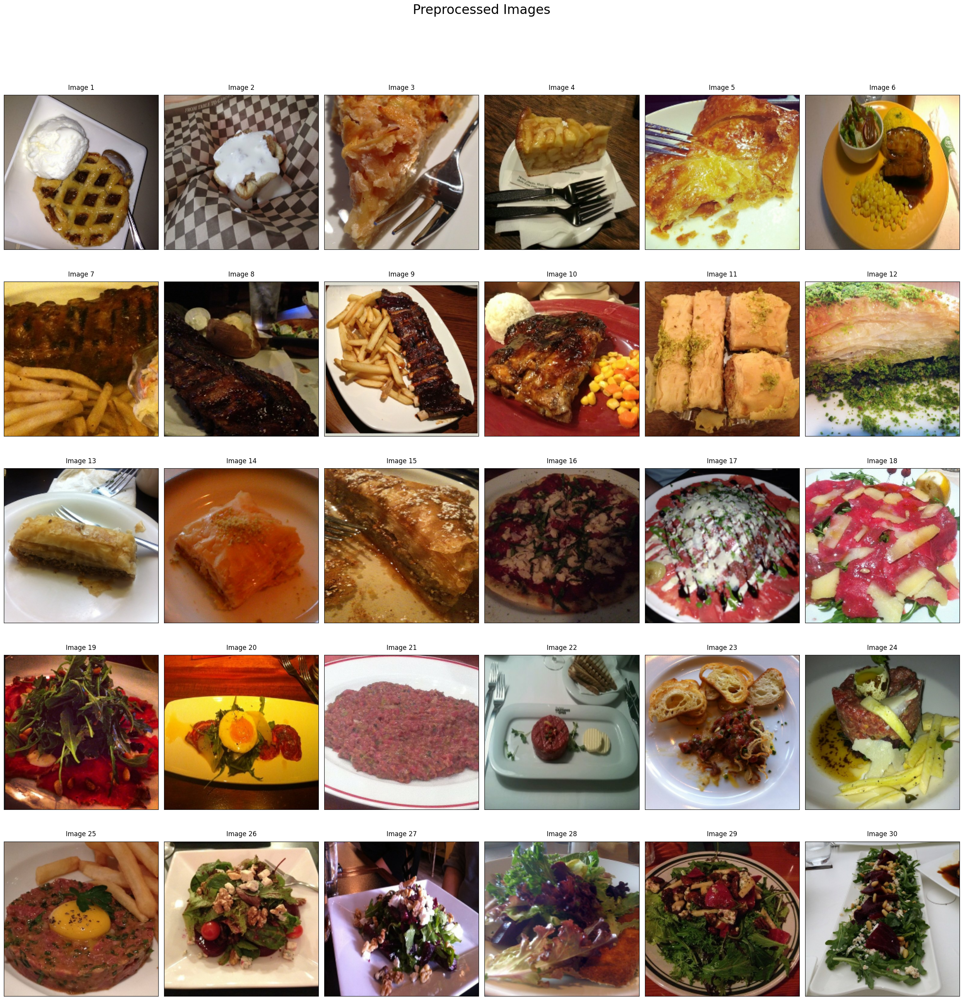

In [ ]:

def plot_preprocessed_images(image_paths, num_images=5, img_size=(224, 224)):

    # Load and preprocess images
    images = [preprocess_img(path, img_size) for path in image_paths[:num_images]]
    images = tf.stack(images)  # Stack images into a batch

    # Convert images to numpy array for visualization
    images = images.numpy()

    # Plot images
    rows = int(np.ceil(num_images / 6))  # Adjust rows based on number of images
    cols = min(num_images, 6)            # Maximum of 6 columns

    fig, ax = plt.subplots(rows, cols, figsize=(25, 25))
    fig.suptitle("Preprocessed Images", y=1.05, fontsize=24)

    for i in range(rows):
        for j in range(cols):
            idx = i * cols + j
            if idx < num_images:
                ax[i][j].imshow(images[idx])
                ax[i][j].set_title(f"Image {idx + 1}", pad=10)
            else:
                ax[i][j].axis('off')  # Hide unused subplots

    plt.setp(ax, xticks=[], yticks=[])
    plt.tight_layout()
    plt.show()

# Example usage
# Generate a list of file paths to some images
sample_image_paths = [os.path.join(data_dir, food_name, img_name)
                      for food_name in foods_sorted[:10]  # Example: taking first 10 classes
                      for img_name in os.listdir(os.path.join(data_dir, food_name))[:5]]  # Taking first 5 images per class

plot_preprocessed_images(sample_image_paths, num_images=30)  # Display up to 30 preprocessed images

## 4. Mixed Precision Training: Unlocking Speed



In [ ]:
# Importing the arsenal
from tensorflow.keras import mixed_precision

# Setting the global policy to mixed precision
mixed_precision.set_global_policy('mixed_float16')

print("Mixed precision training enabled with policy:", mixed_precision.global_policy())

Mixed precision training enabled with policy: <DTypePolicy "mixed_float16">


In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
initial_learning_rate = 0.001
lr_schedule = ExponentialDecay(
    initial_learning_rate,
    decay_steps=10000, #  1000 step
    decay_rate=0.9,
    staircase=True
)

In [ ]:
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(101, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
optimizer = Adam(learning_rate=lr_schedule) # Adam W <- More stable
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
checkpointer = ModelCheckpoint(filepath='best_food101_model.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_food101.log')
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
tensorboard_callback = TensorBoard(log_dir='./logs', histogram_freq=1)

In [ ]:
history = model.fit(
    train_datagen.flow_from_directory('train', target_size=(224, 224), batch_size=32),
    validation_data=test_datagen.flow_from_directory('test', target_size=(224, 224), batch_size=32),
    epochs=10,
    callbacks=[csv_logger, checkpointer, early_stopping, tensorboard_callback]
)

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.2851 - loss: 3.0890
Epoch 1: val_loss improved from inf to 1.72320, saving model to best_food101_model.keras
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 1089s 421ms/step - accuracy: 0.2852 - loss: 3.0885 - val_accuracy: 0.5653 - val_loss: 1.7232
Epoch 2/10
2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.5505 - loss: 1.7853
Epoch 2: val_loss improved from 1.72320 to 1.50559, saving model to best_food101_model.keras
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 936s 394ms/step - accuracy: 0.5505 - loss: 1.7853 - val_accuracy: 0.6095 - val_loss: 1.5056
Epoch 3/10
2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.6062 - loss: 1.5625
Epoch 3: val_loss improved from 1.50559 to 1.48417, saving model to best_food101_model.keras
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 944s 398ms/step - accuracy: 0.6062 - loss: 1.5625 - val_accuracy: 0.6300 - val_loss: 1.4842
Epoch 4/10
2367/2368 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.6428 - loss: 1.4144
Epoch 

# 5. Evaluation:

##	Use tensor callbacks.

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

test_generator = test_datagen.flow_from_directory(
    'test',
    target_size=(224, 224),
    batch_size=32,
    shuffle=False
)

# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())


Found 25250 images belonging to 101 classes.
790/790 ━━━━━━━━━━━━━━━━━━━━ 68s 79ms/step


## Conduct different evaluation metrices (Precision – Recall – F1-Score).

In [ ]:
# Generate classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)


                         precision    recall  f1-score   support

              apple_pie       0.54      0.46      0.50       250
         baby_back_ribs       0.74      0.81      0.77       250
                baklava       0.72      0.87      0.79       250
         beef_carpaccio       0.75      0.87      0.81       250
           beef_tartare       0.85      0.67      0.75       250
             beet_salad       0.73      0.70      0.71       250
               beignets       0.75      0.84      0.79       250
               bibimbap       0.94      0.86      0.90       250
          bread_pudding       0.54      0.60      0.57       250
      breakfast_burrito       0.87      0.52      0.65       250
             bruschetta       0.70      0.67      0.68       250
           caesar_salad       0.77      0.92      0.84       250
                cannoli       0.88      0.80      0.84       250
          caprese_salad       0.71      0.82      0.76       250
            carrot_cake 

## Conduct confusion matrix.

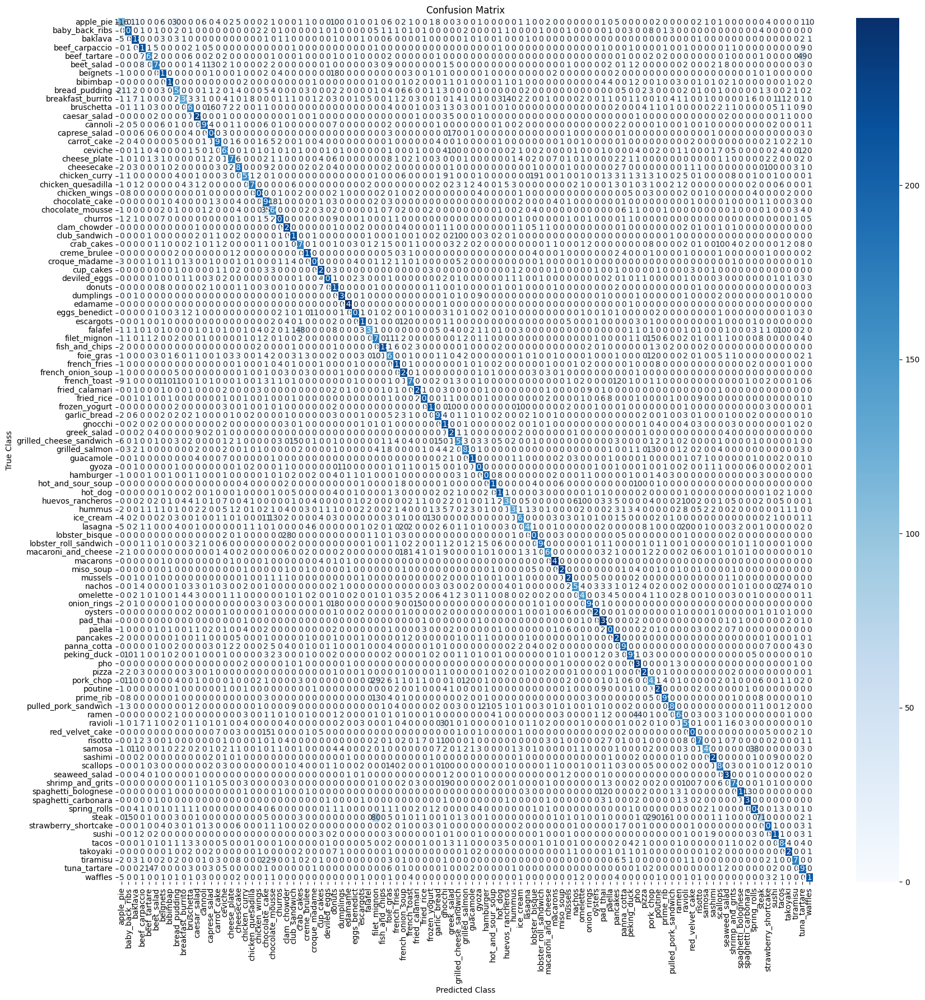

In [ ]:
# Generate confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(20, 20))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()


# The End
#By
# Yassin Ehab —> 20216117
#Jana Soliman —> 20216129
#Menna Elminshawy —> 20217011